<a href="https://colab.research.google.com/github/balakumarr15/balakumarr2001/blob/main/Deep_Transfer_based_Bone_Cancer_Diagnosis_System_Using_VGG16_Feature_Extraction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing all files

In [1]:
import os

import PIL
import cv2
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
from IPython import display
from google.colab import drive
from pandas import read_csv
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, mutual_info_classif
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, mean_squared_error, precision_score, recall_score, classification_report, f1_score, confusion_matrix, ConfusionMatrixDisplay, plot_confusion_matrix, roc_curve, roc_auc_score, precision_recall_curve, fbeta_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from torch import nn
from torchvision import models, transforms
from tqdm import tqdm

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# Function for Displaying Image

In [2]:
def cv2_imshow(a):
    a = a.clip(0, 255).astype('uint8')
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    display.display(PIL.Image.fromarray(a))

# Pre-processing

Applying Median Filter and Canny Edge Detection Algorithm for Healthy Bone


H02.JPG


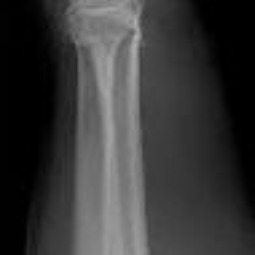

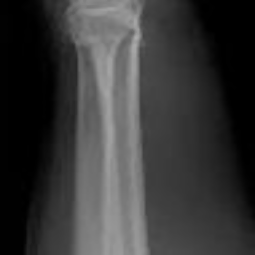

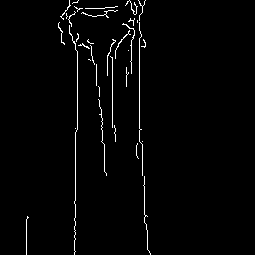


H31.jpg


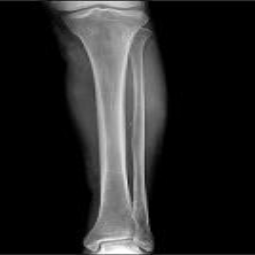

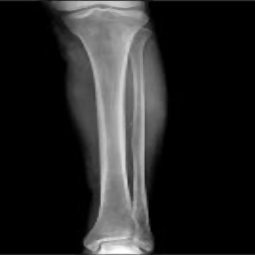

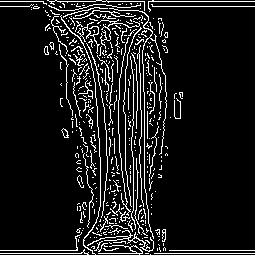


H10.JPG


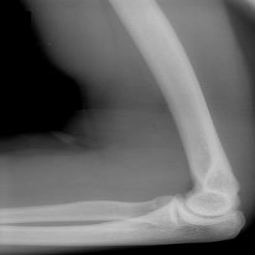

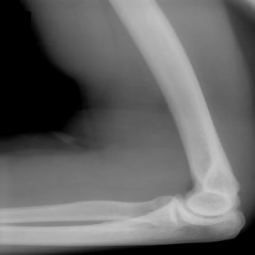

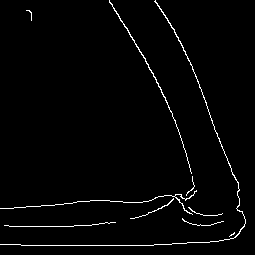


H46.JPG


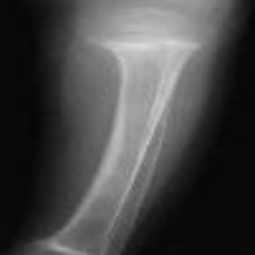

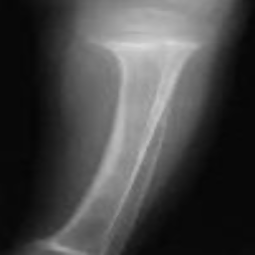

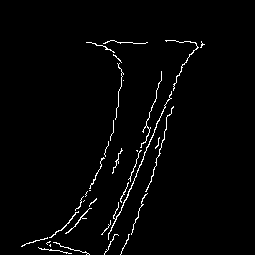


H21.JPG


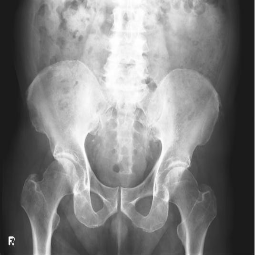

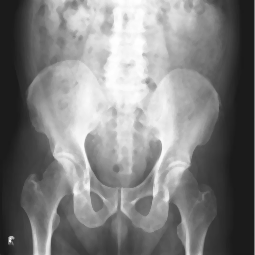

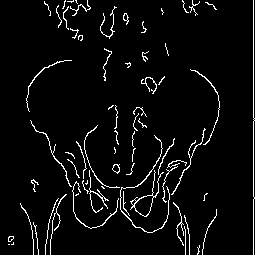


H28.jpg


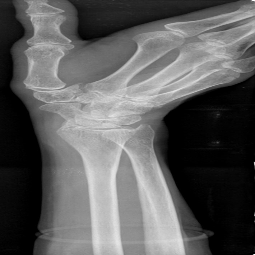

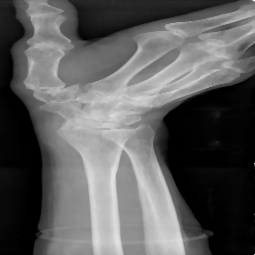

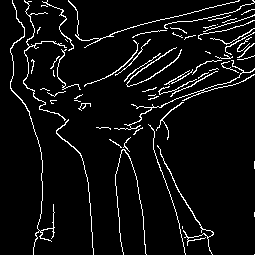


H37.jpg


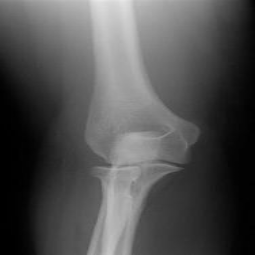

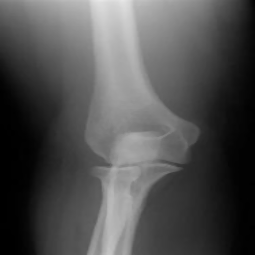

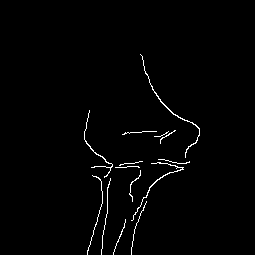


H38.jpg


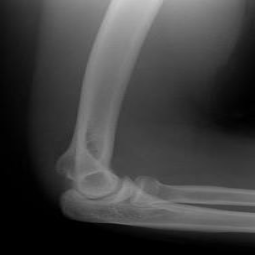

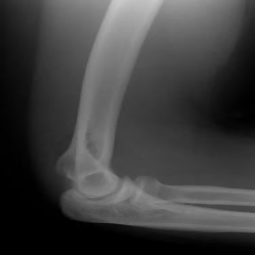

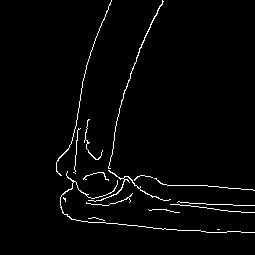


H44.JPG


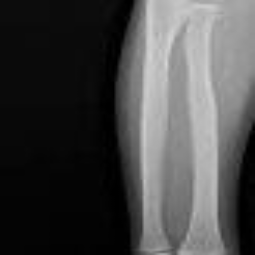

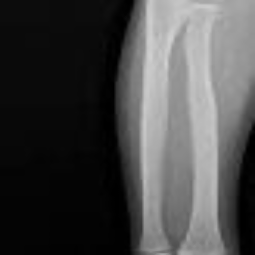

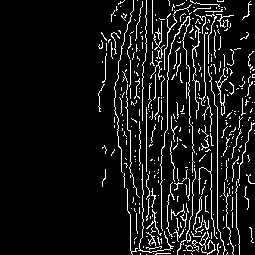


H42.JPG


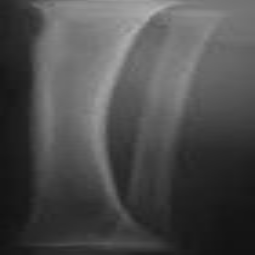

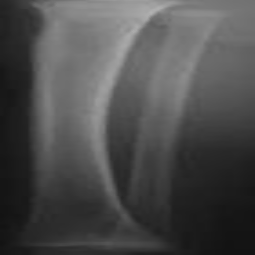

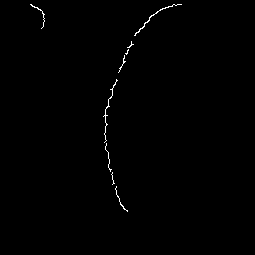


H03.JPG


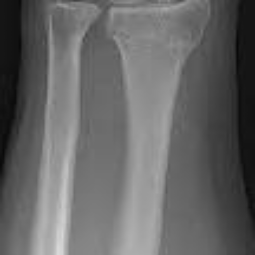

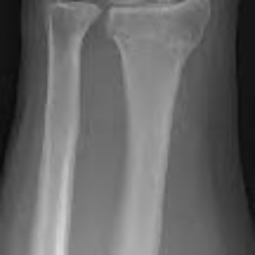

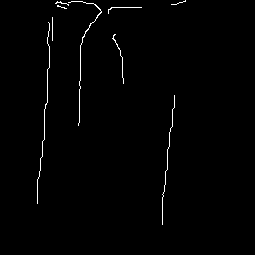


H40.jpg


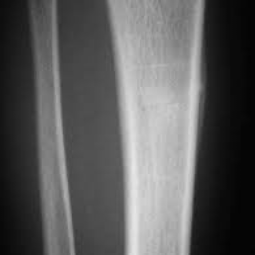

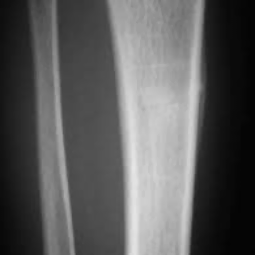

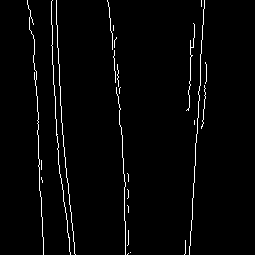


H33.jpg


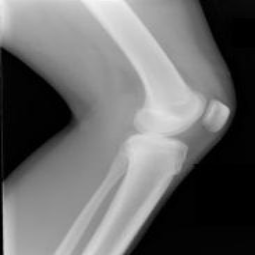

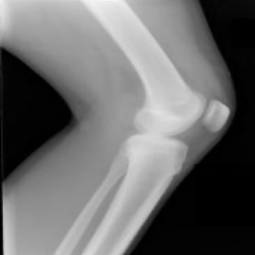

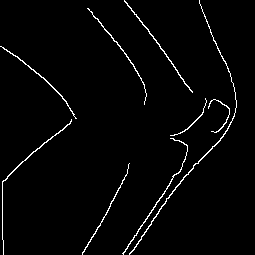


H43.JPG


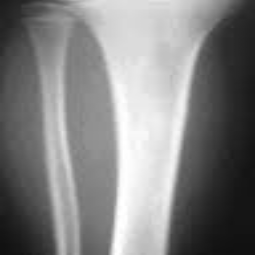

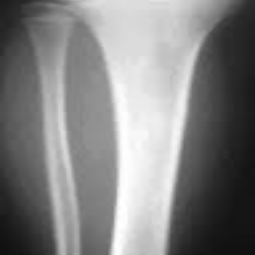

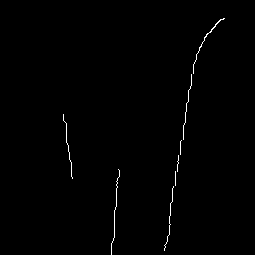


H36.jpg


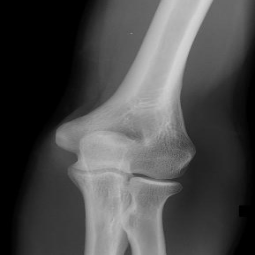

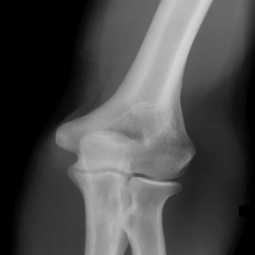

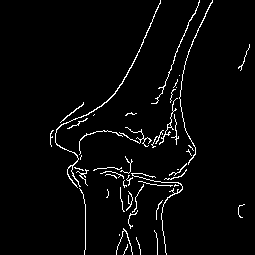


H16.jpg


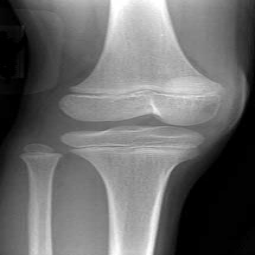

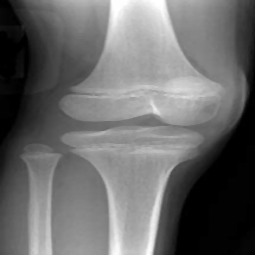

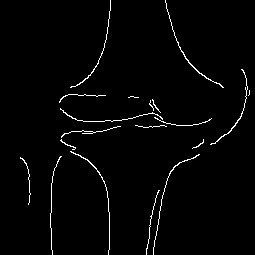


H11.jpg


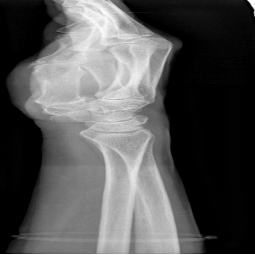

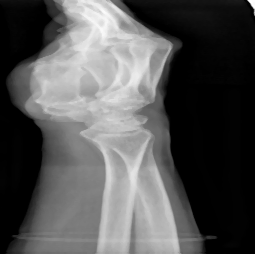

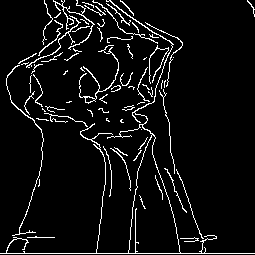


H19.jpg


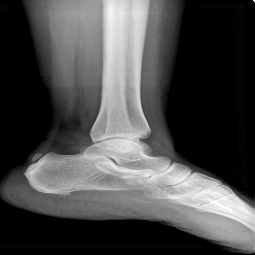

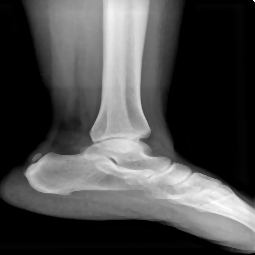

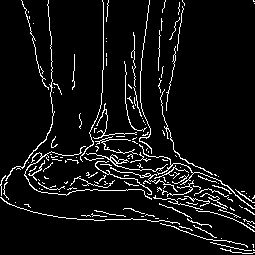


H13.jpg


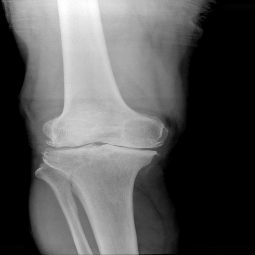

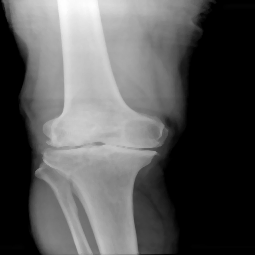

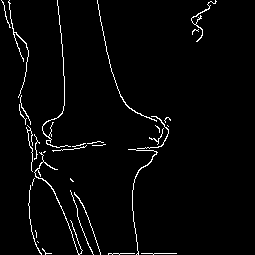


H07.jpg


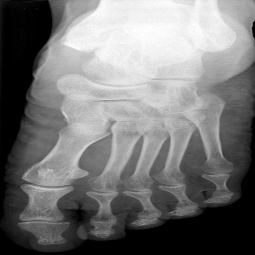

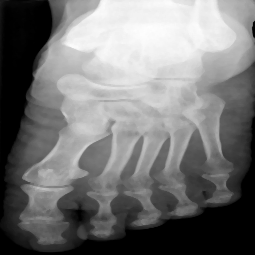

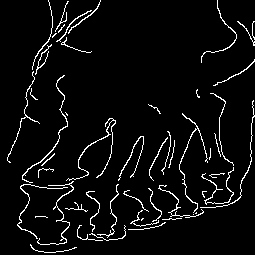


H25.jpg


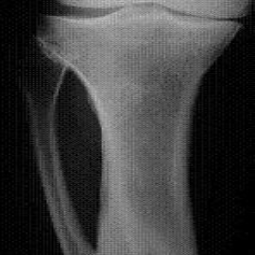

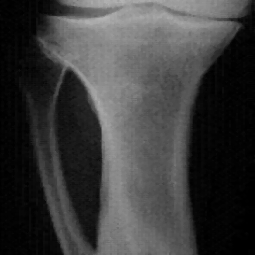

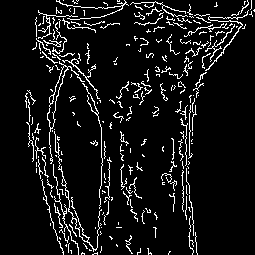


H45.JPG


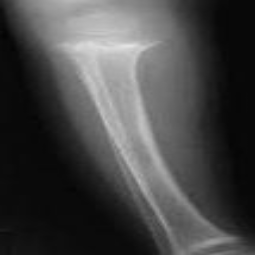

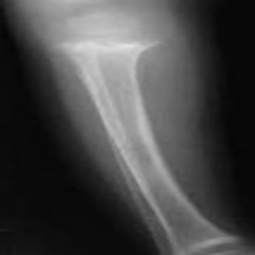

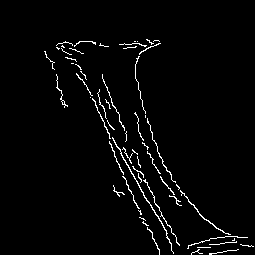


H01.JPG


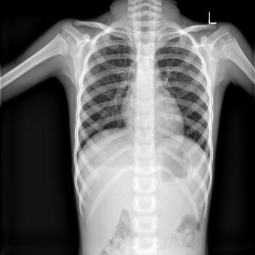

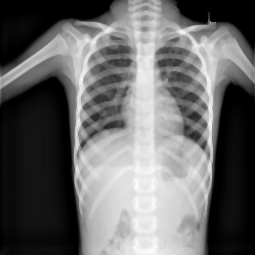

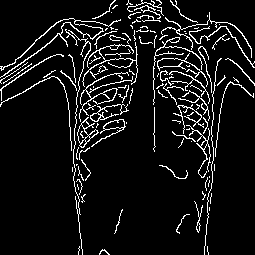


H47.jpg


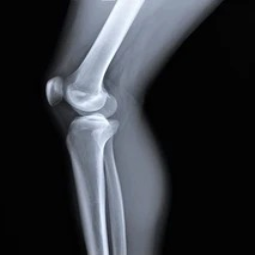

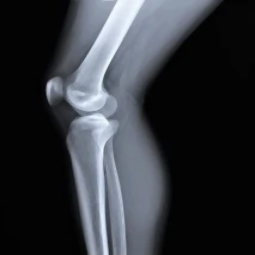

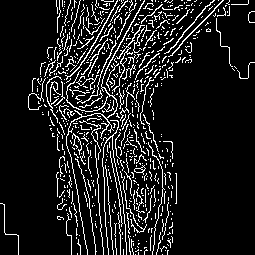


H30.JPG


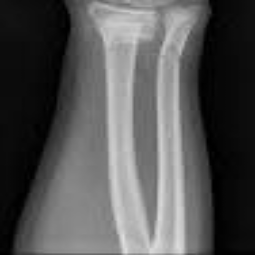

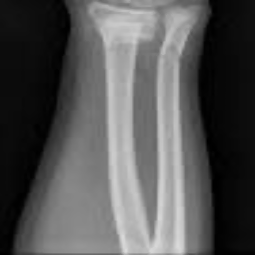

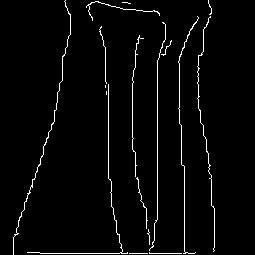


H26.jpg


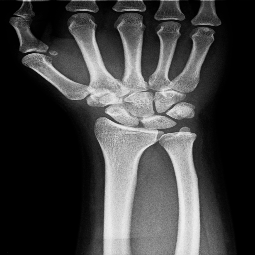

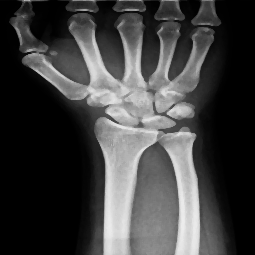

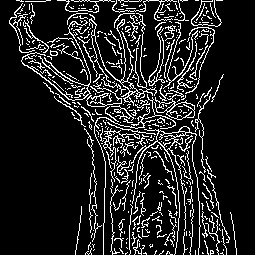


H18.jpg


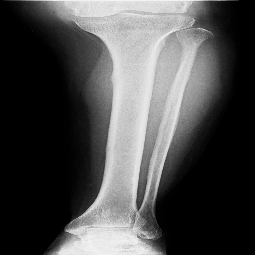

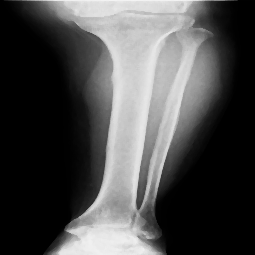

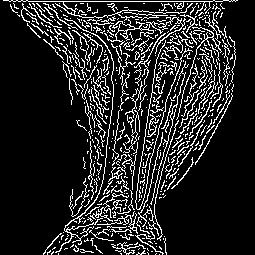


H06.jpg


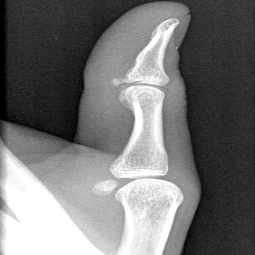

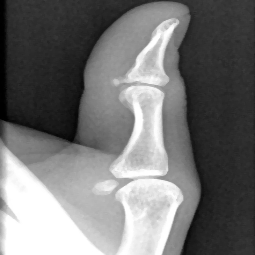

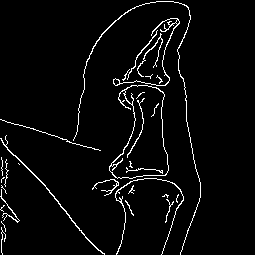


H48.jpg


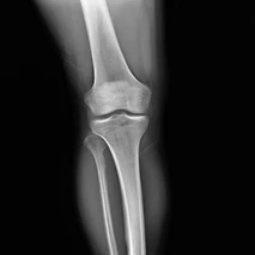

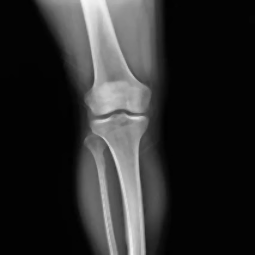

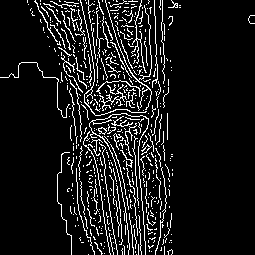


H24.JPG


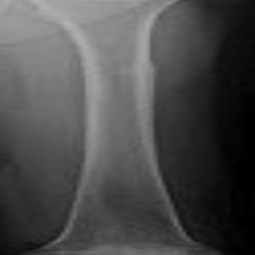

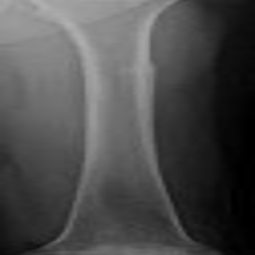

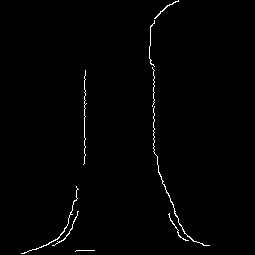


H29.jpg


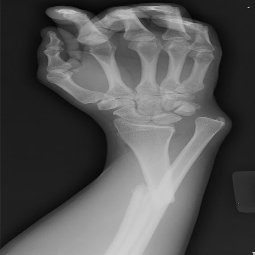

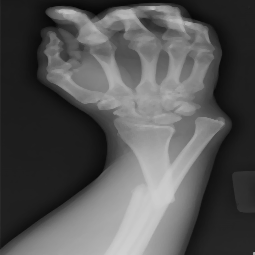

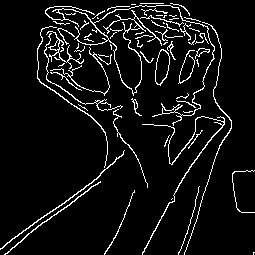


H32.jpg


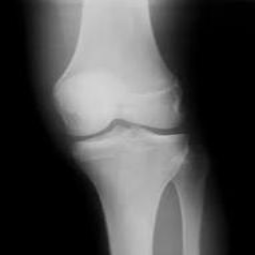

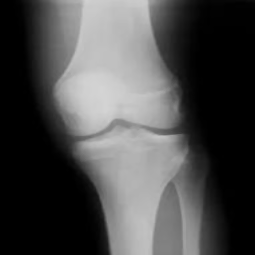

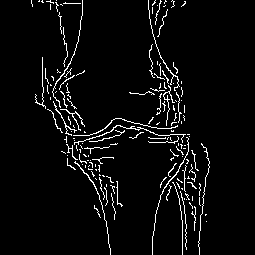


H39.jpg


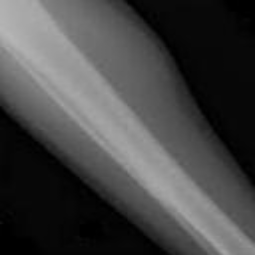

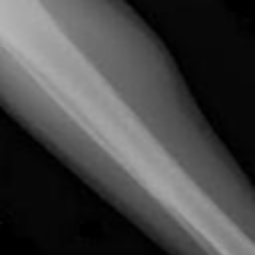

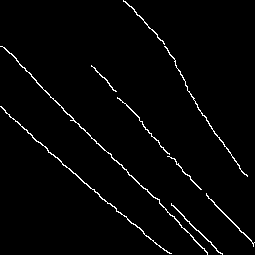


H23.jpg


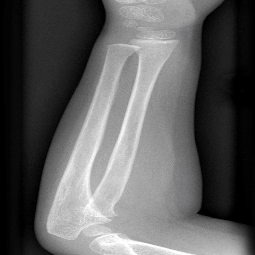

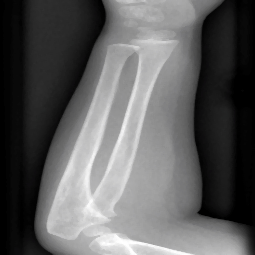

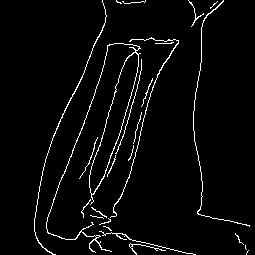


H12.JPG


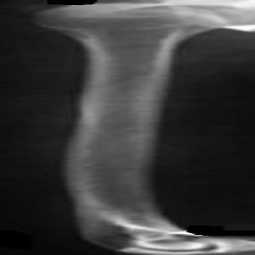

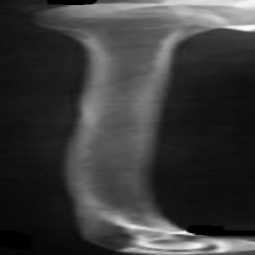

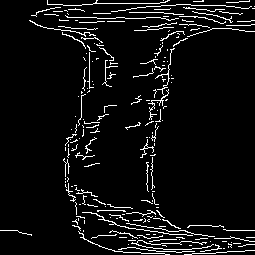


H27.jpg


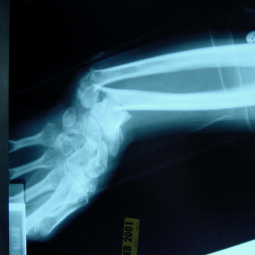

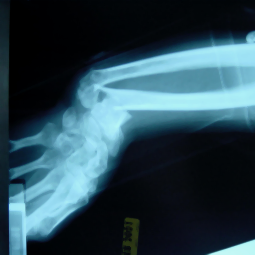

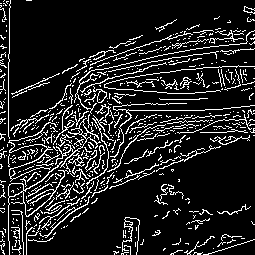


H34.jpg


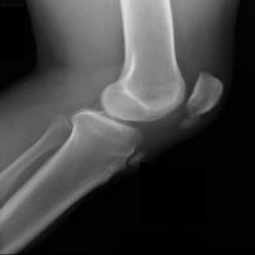

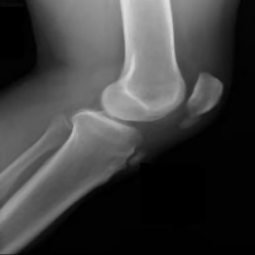

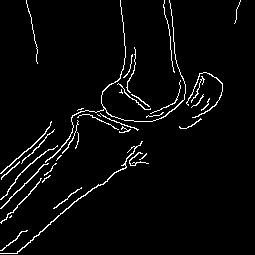


H22.jpg


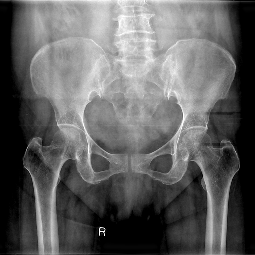

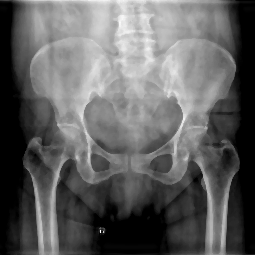

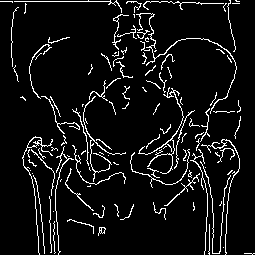


H05.JPG


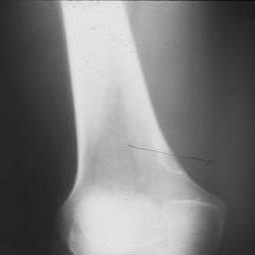

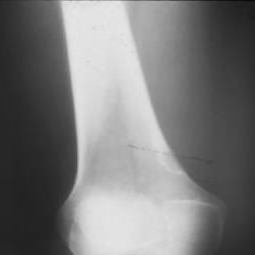

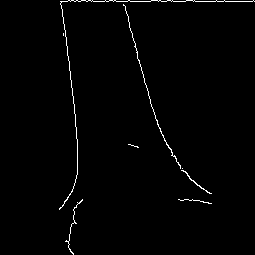


H15.JPG


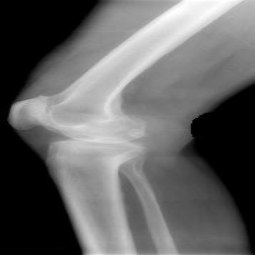

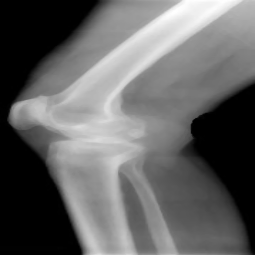

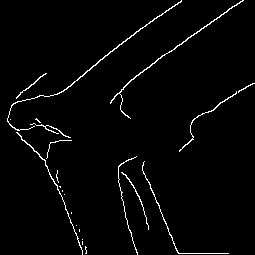


H08.JPG


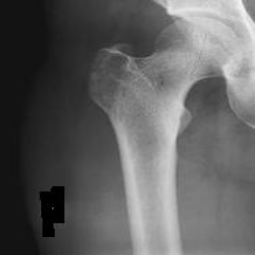

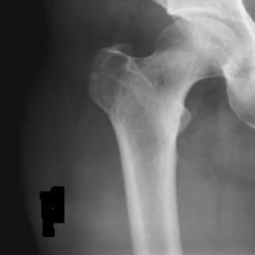

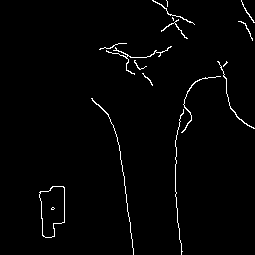


H17.jpg


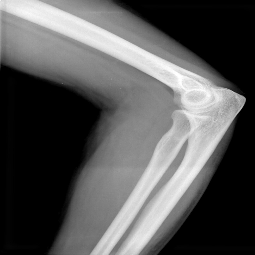

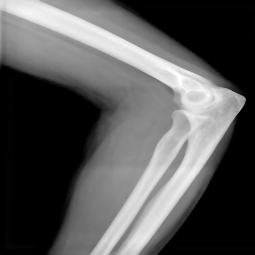

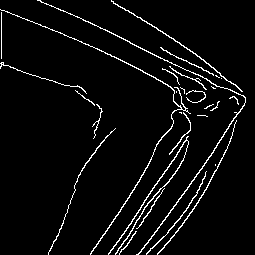


H09.jpg


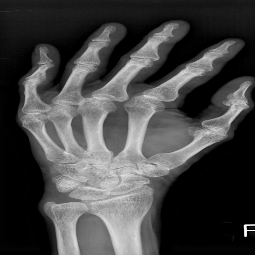

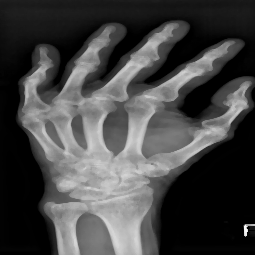

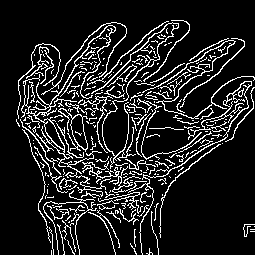


H35.jpg


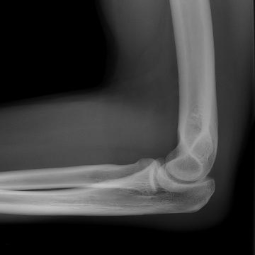

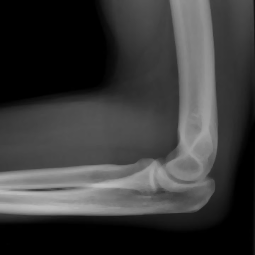

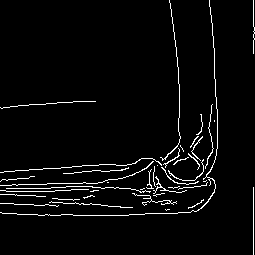


H04.jpg


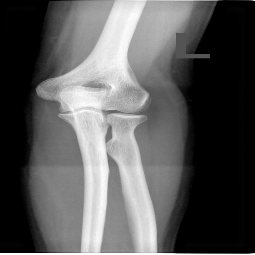

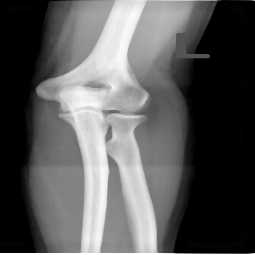

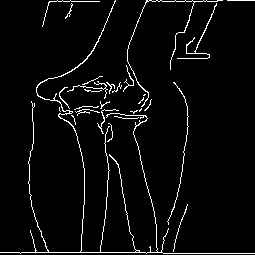


H41.JPG


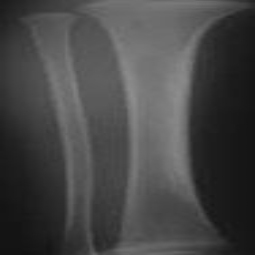

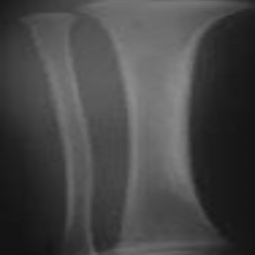

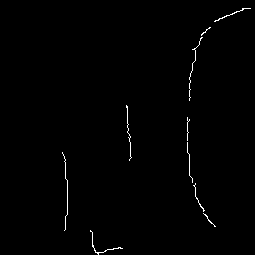


H20.jpg


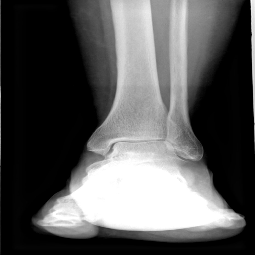

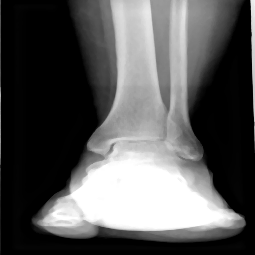

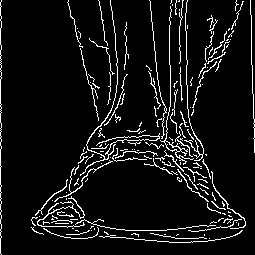


H14.JPG


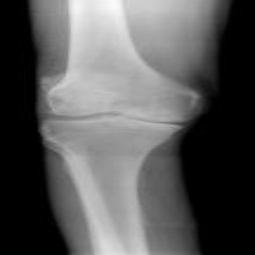

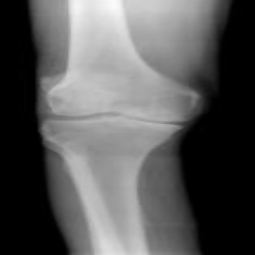

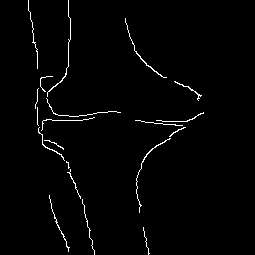

In [ ]:
try:
  file_list=os.listdir(r"/content/drive/MyDrive/CIP - SEM 6/Healthy Bone")
  for i in file_list:
    img_original_healthy = cv2.imread("/content/drive/MyDrive/CIP - SEM 6/Healthy Bone/"+i)
    img_original_healthy = cv2.resize(img_original_healthy, (255, 255))
    img_healthy = cv2.medianBlur(img_original_healthy, 3)

    sigma = 0.3
    median = np.median(img_healthy)
    lower = int(max(0, (1.0 - sigma) * median)) 
    upper = int(min(255, (1.0 + sigma) * median)) 
    auto_canny_healthy = cv2.Canny(img_healthy, lower, upper)
    print(i)
    cv2_imshow(img_original_healthy)
    cv2_imshow(img_healthy)
    cv2_imshow(auto_canny_healthy)
    print()
    cv2.waitKey(0)
    cv2.destroyAllWindows()
except TypeError:
  pass

Applying Median Filter and Canny Edge Detection Algorithm for Cancerous Bone


C15.JPG


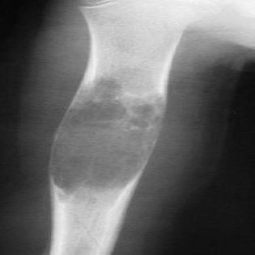

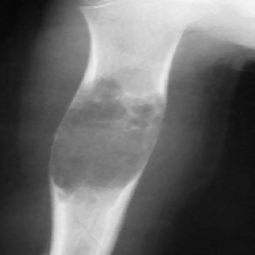

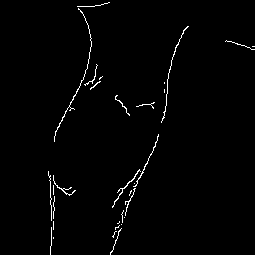


C12.JPG


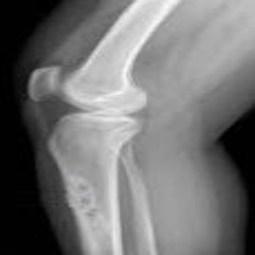

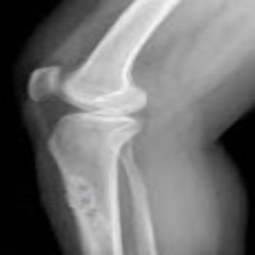

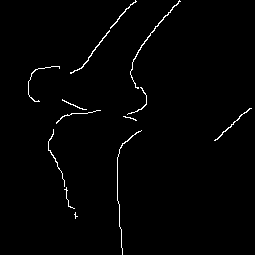


C40.jpg


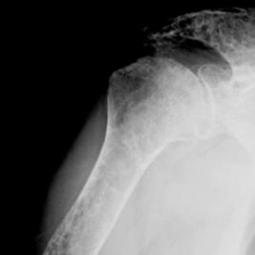

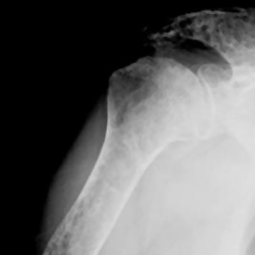

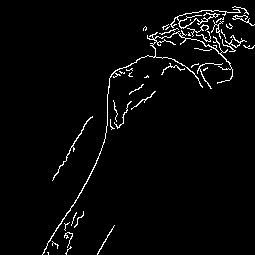


C22.jpg


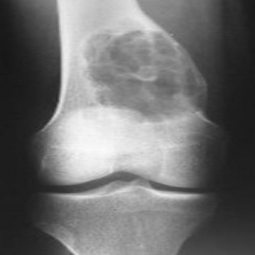

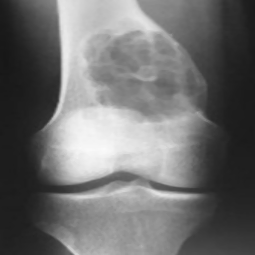

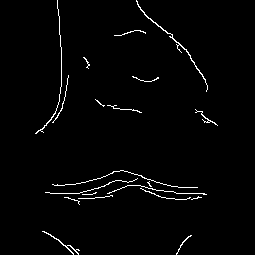


C24.jpg


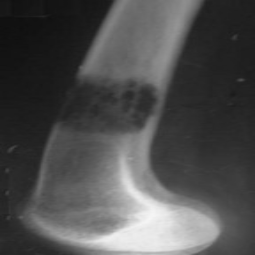

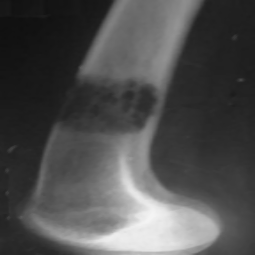

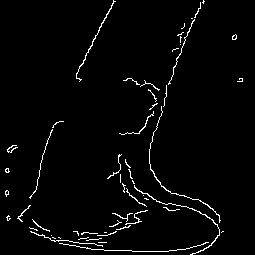


C19.JPG


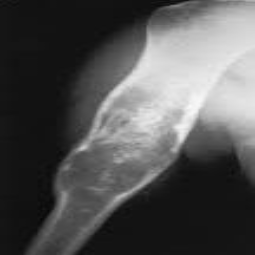

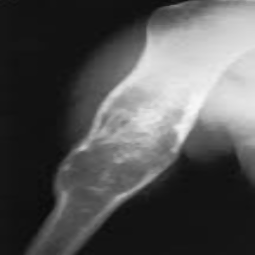

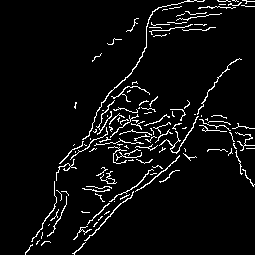


C08.jpg


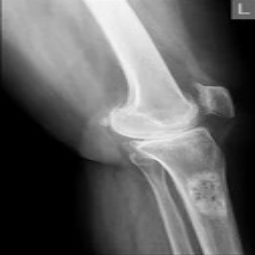

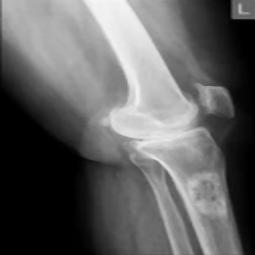

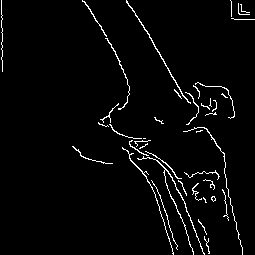


C59.jpg


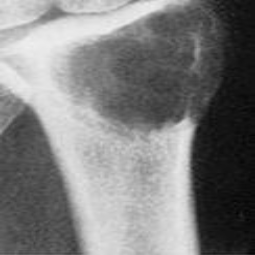

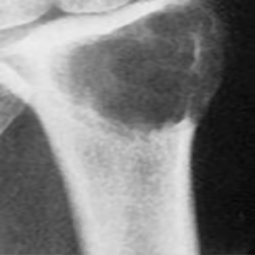

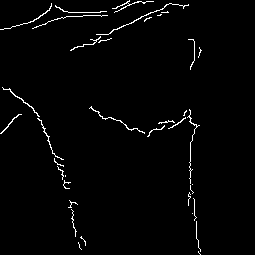


C64.jpg


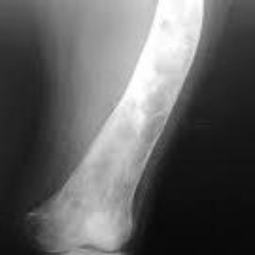

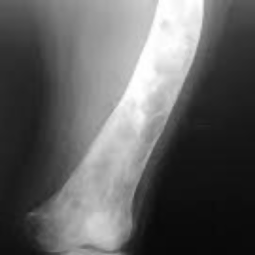

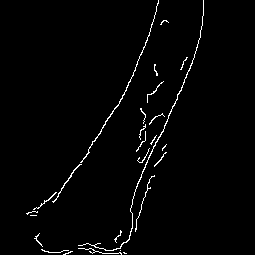


C61.jpg


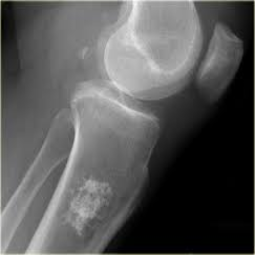

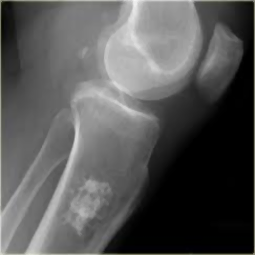

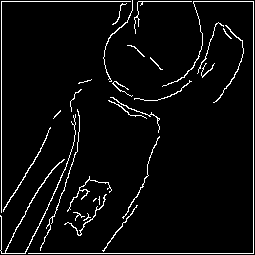


C67.jpg


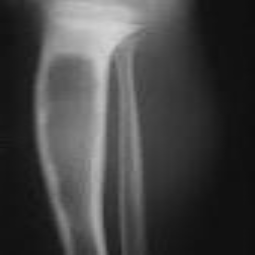

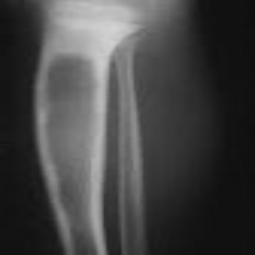

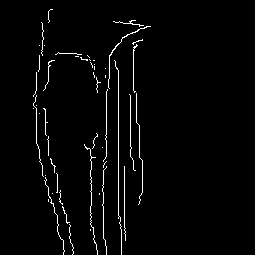


C46.jpg


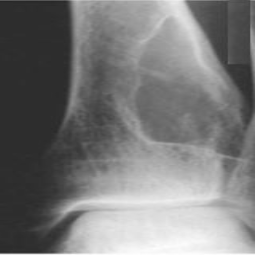

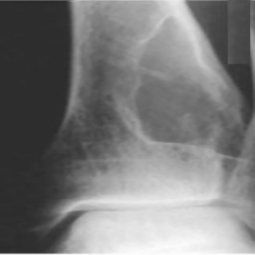

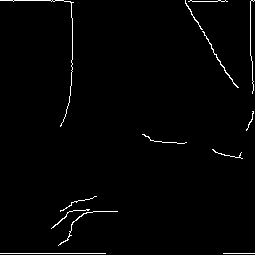


C09.JPG


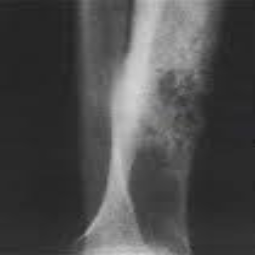

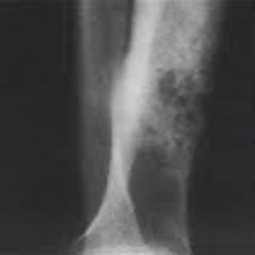

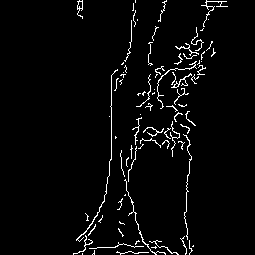


C31.jpg


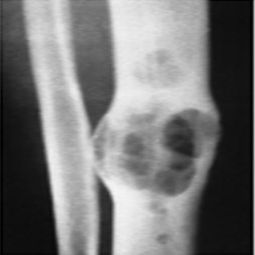

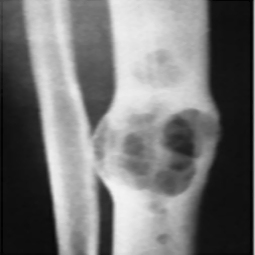

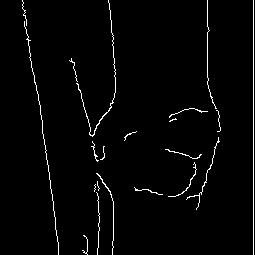


C65.jpg


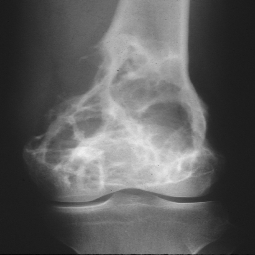

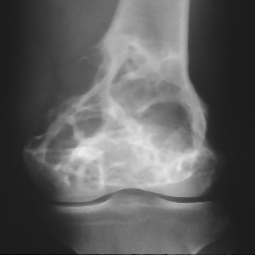

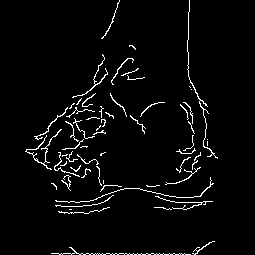


C16.JPG


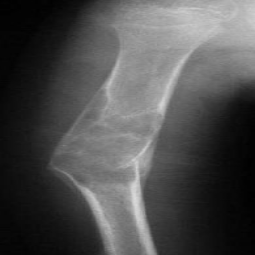

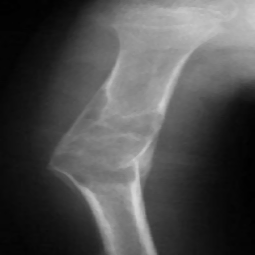

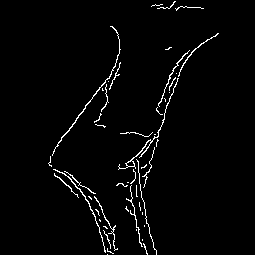


C21.jpg


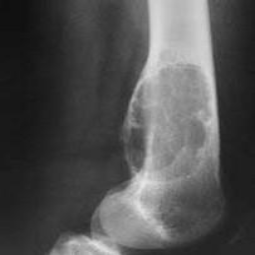

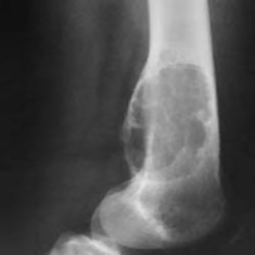

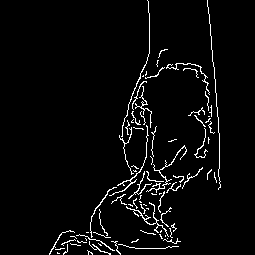


C55.jpg


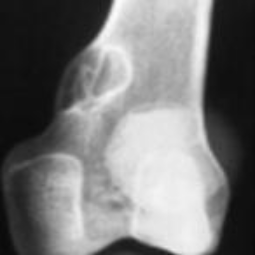

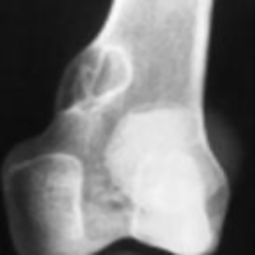

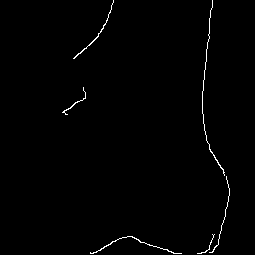


C37.jpg


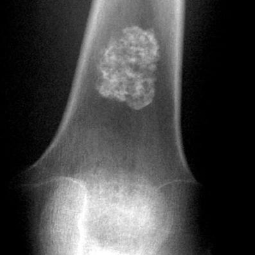

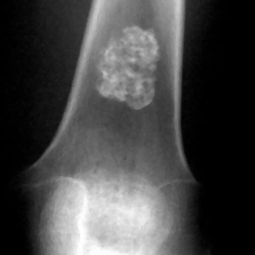

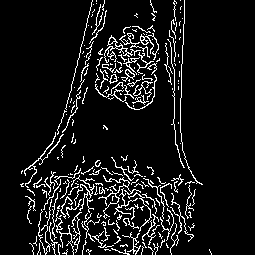


C30.jpg


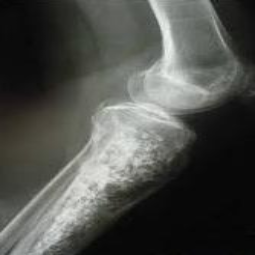

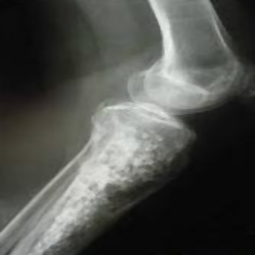

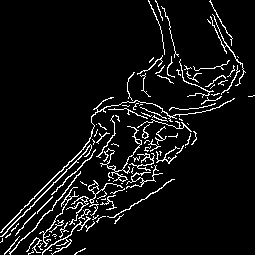


C60.jpg


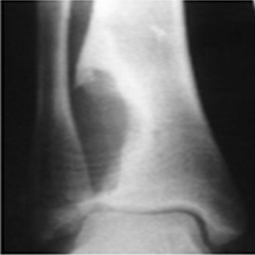

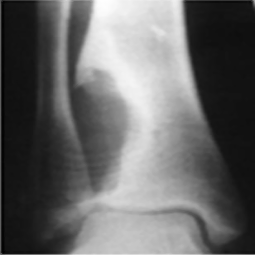

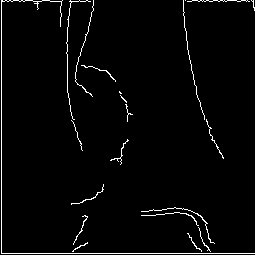


C58.jpg


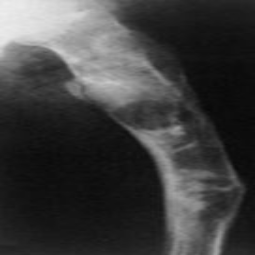

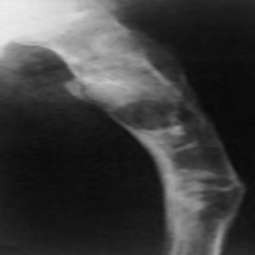

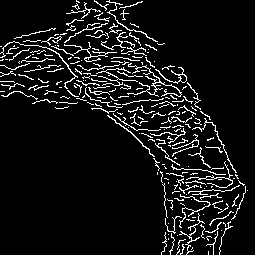


C57.jpg


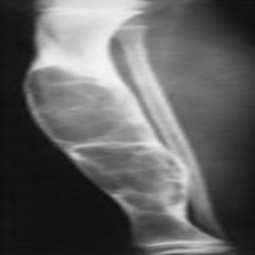

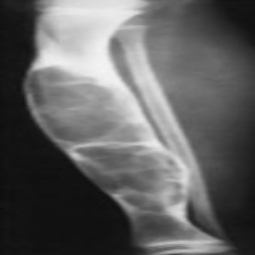

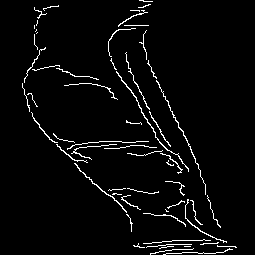


C06.jpg


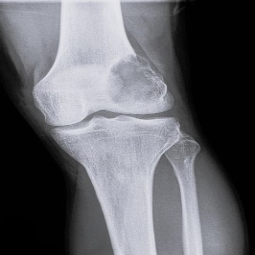

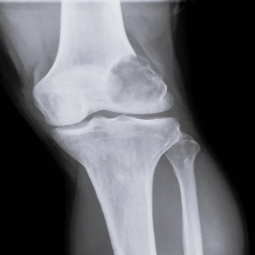

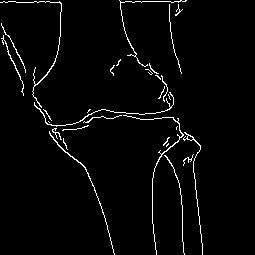


C13.JPG


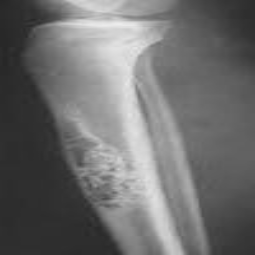

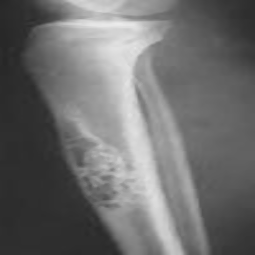

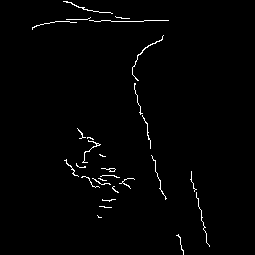


C02.JPG


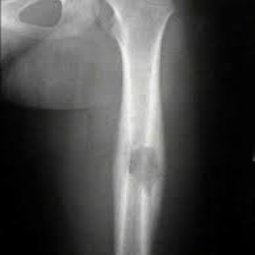

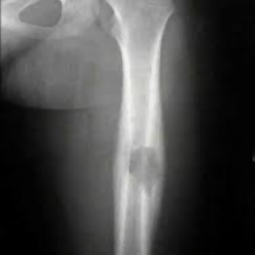

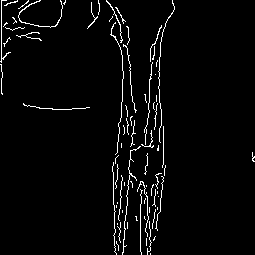


C47.jpg


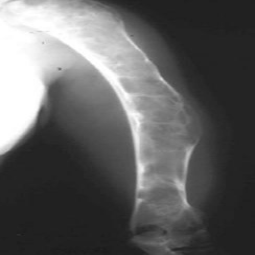

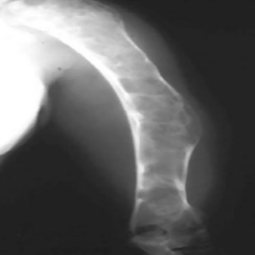

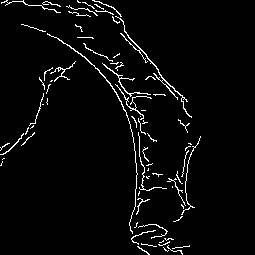


C66.jpg


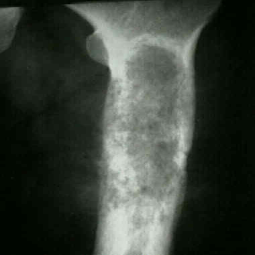

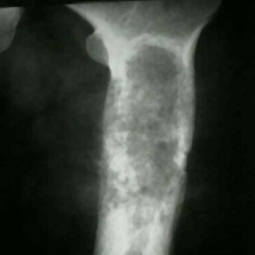

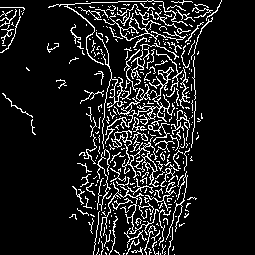


C05.JPG


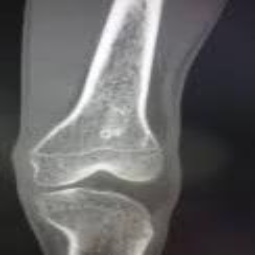

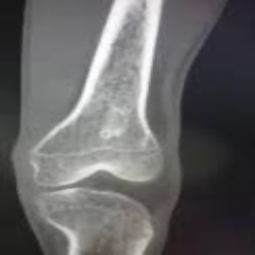

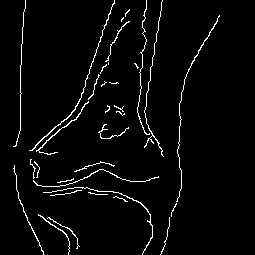


C07.jpg


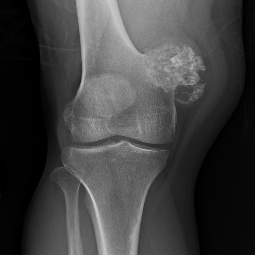

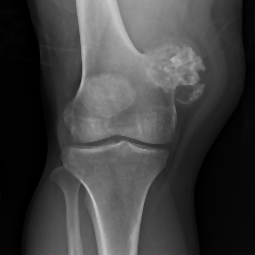

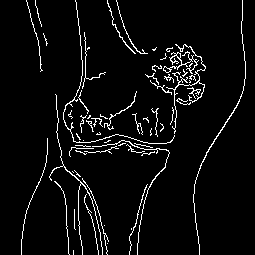


C29.jpg


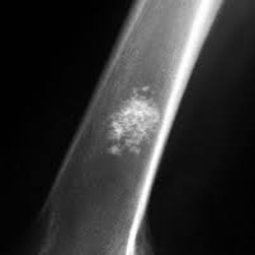

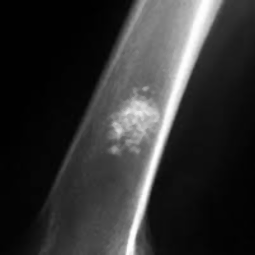

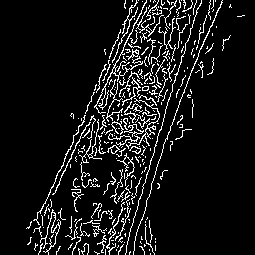


C56.jpg


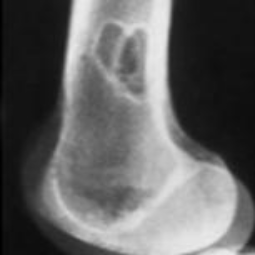

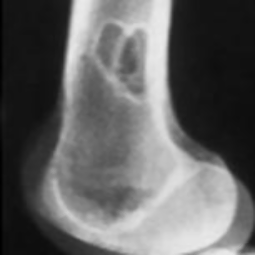

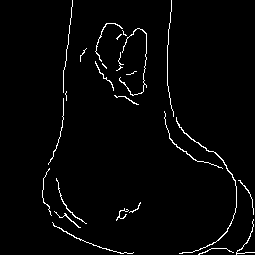


C52.jpg


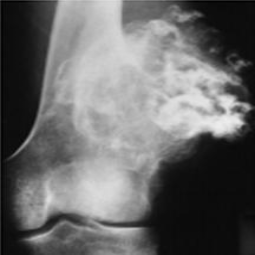

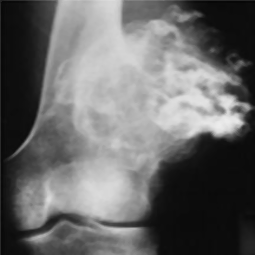

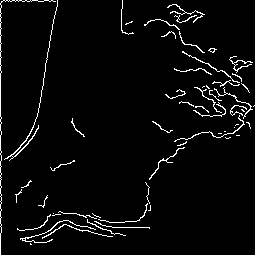


C44.jpg


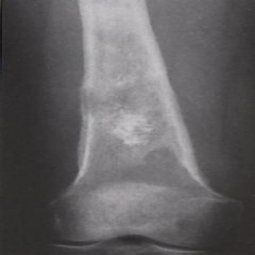

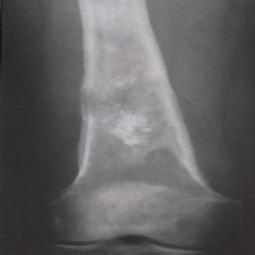

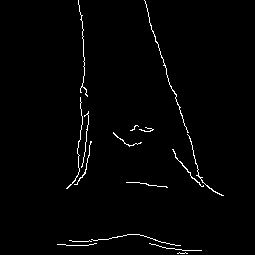


C33.jpg


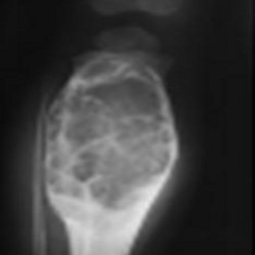

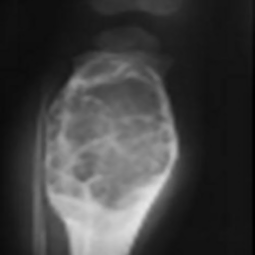

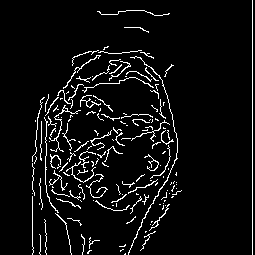


C68.jpg


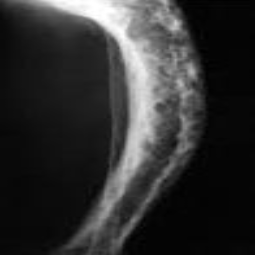

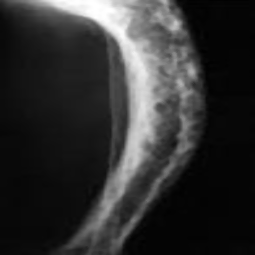

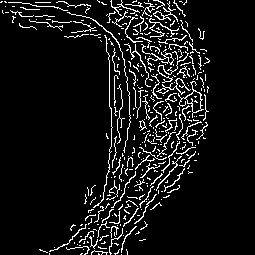


C04.JPG


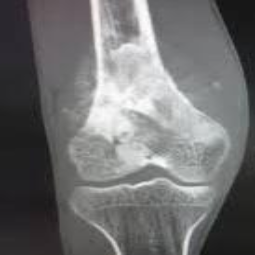

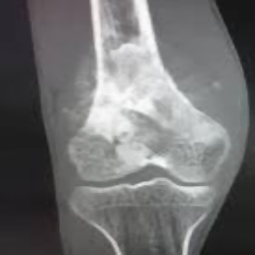

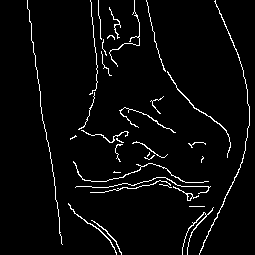


C49.jpg


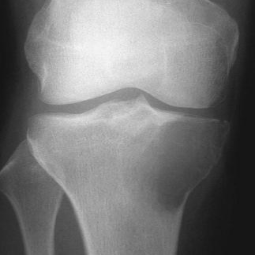

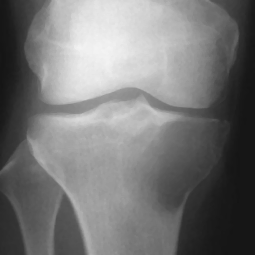

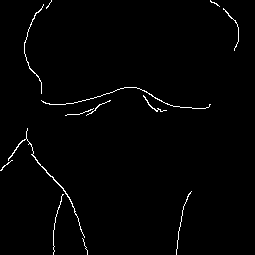


C03.JPG


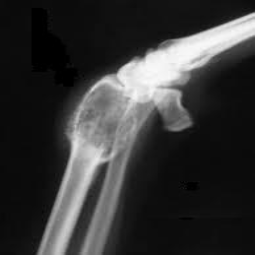

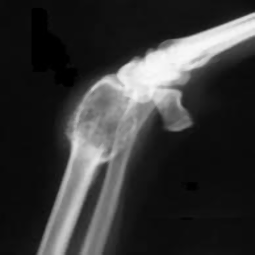

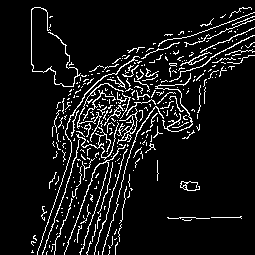


C45.jpg


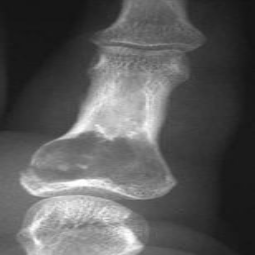

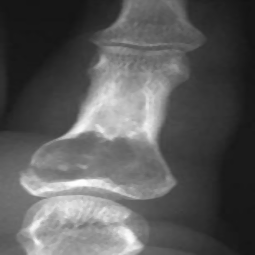

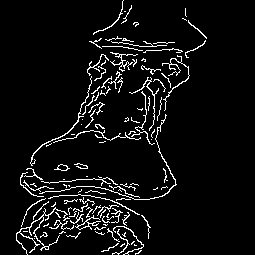


C27.jpg


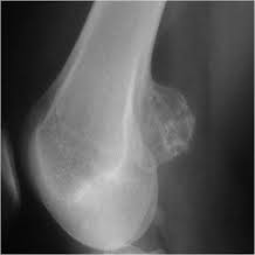

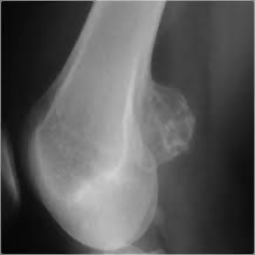

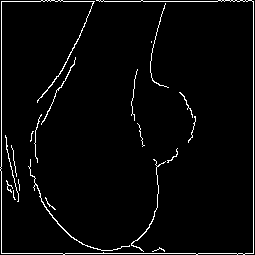


C39.jpg


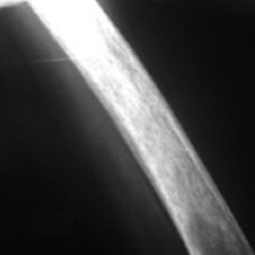

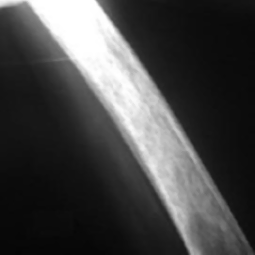

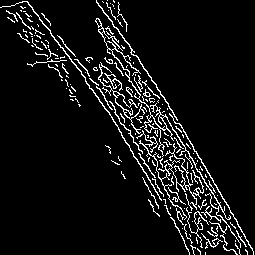


C14.JPG


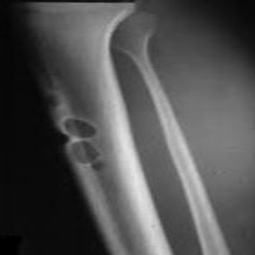

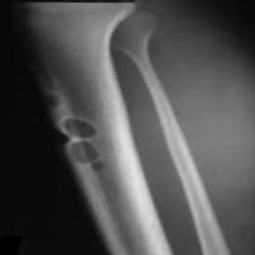

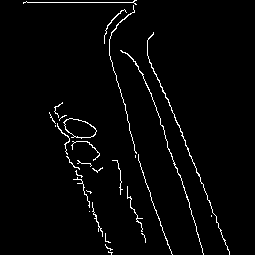


C69.jpg


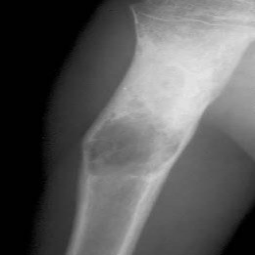

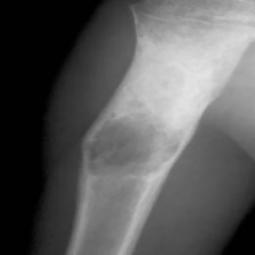

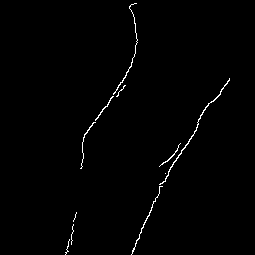


C28.jpg


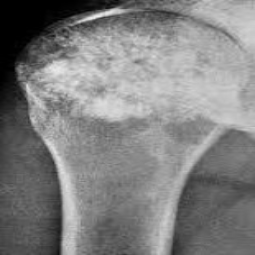

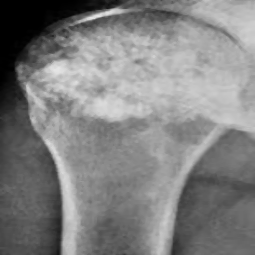

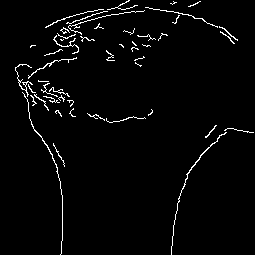


C10.JPG


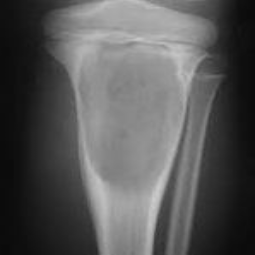

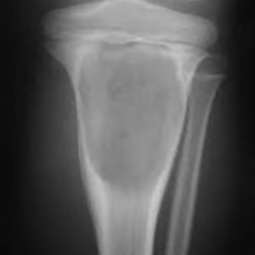

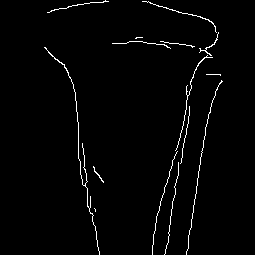


C11.jpg


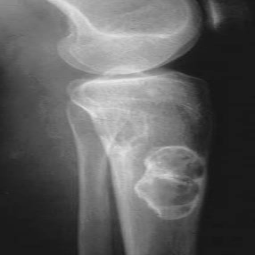

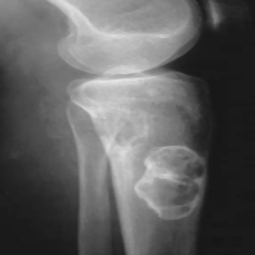

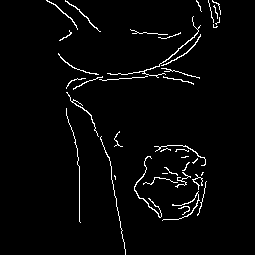


C01.jpg


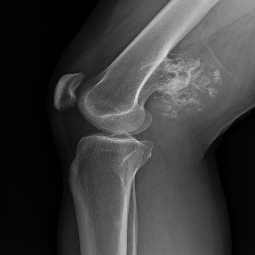

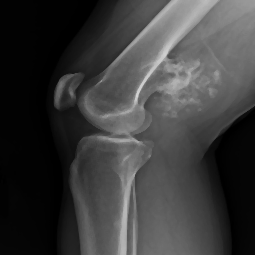

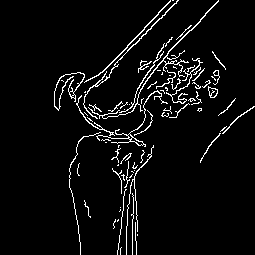


C32.jpg


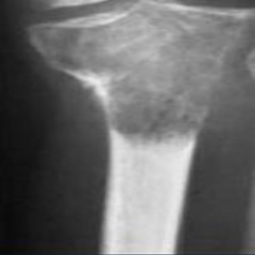

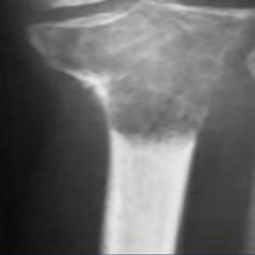

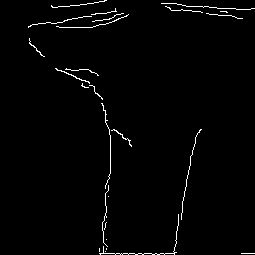


C50.jpg


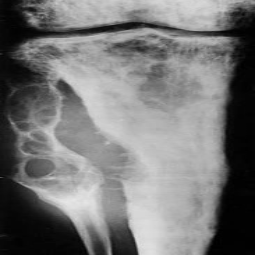

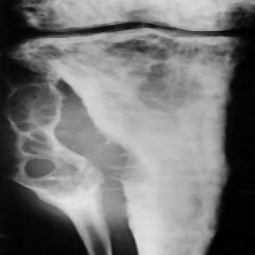

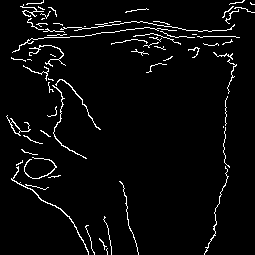


C23.jpg


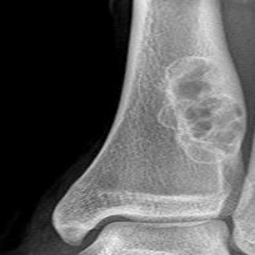

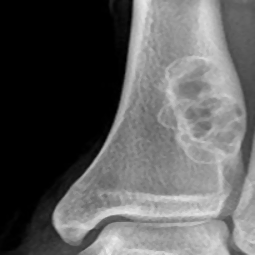

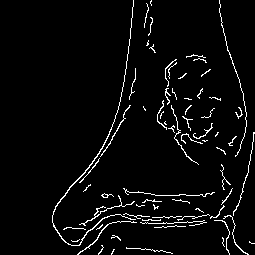


C51.jpg


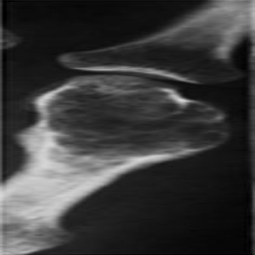

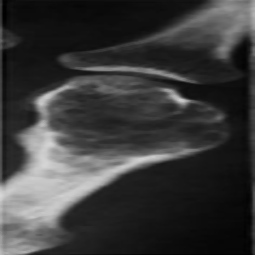

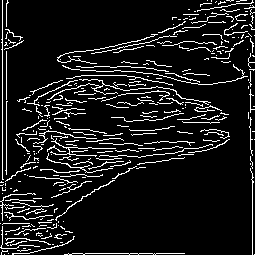


C20.jpg


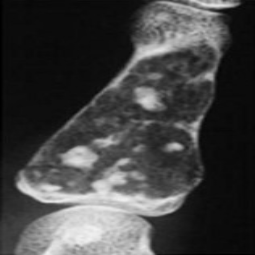

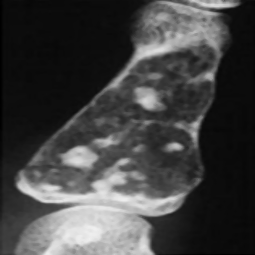

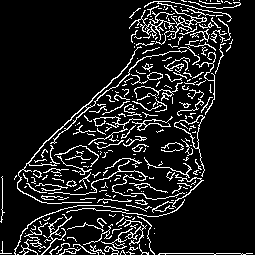


C17.jpg


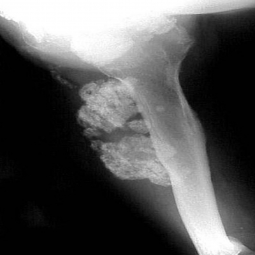

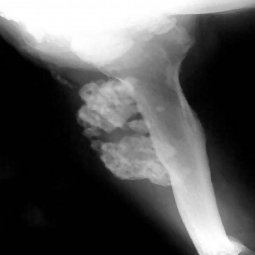

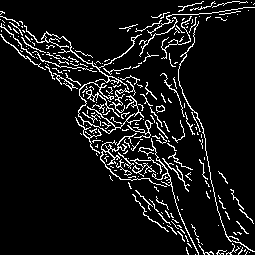

In [ ]:
try:
  file_list=os.listdir(r"/content/drive/MyDrive/CIP - SEM 6/Cancerous Bone")
  for i in file_list:
    img_original_cancerous = cv2.imread("/content/drive/MyDrive/CIP - SEM 6/Cancerous Bone/"+i)
    img_original_cancerous = cv2.resize(img_original_cancerous, (255, 255))
    img_cancerous = cv2.medianBlur(img_original_cancerous, 3)

    sigma = 0.3
    median = np.median(img_cancerous)
    lower = int(max(0, (1.0 - sigma) * median)) 
    upper = int(min(255, (1.0 + sigma) * median)) 
    auto_canny_cancerous = cv2.Canny(img_cancerous, lower, upper)
    print(i)
    cv2_imshow(img_original_cancerous)
    cv2_imshow(img_cancerous)
    cv2_imshow(auto_canny_cancerous)
    print()
    cv2.waitKey(0)
    cv2.destroyAllWindows()
except TypeError:
  pass

# Feature Extraction


In [4]:
model = models.vgg16(pretrained=True)
# !pip install tensorflow
# from tensorflow.keras.applications import ResNet50
# model = ResNet50(weights="imagenet", include_top=False)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [5]:
# from torch.nn.modules.pooling import AvgPool2d
class FeatureExtractor(nn.Module):
    def __init__(self, model):
        super(FeatureExtractor, self).__init__()
        # Extract VGG-16 Feature Layers
        self.features = list(model.features)
        self.features = nn.Sequential(*self.features)
        # Extract VGG-16 Max Pooling Layer
        # self.pooling = nn.MaxPool2d(1)  # checking
        self.pooling = nn.MaxPool2d(1)
        # Convert the image into one-dimensional vector
        self.flatten = nn.Flatten()
        # Extract the first part of fully-connected layer from VGG16
        self.fc = model.classifier[0]

    def forward(self, x):
        # It will take the input 'x' until it returns the feature vector called 'out'
        out = self.features(x)
        out = self.pooling(out)
        out = self.flatten(out)
        out = self.fc(out)
        return out


new_model = FeatureExtractor(model)

# Change the device to GPU
device = torch.device('cuda:0' if torch.cuda.is_available() else "cpu")
new_model = new_model.to(device)

In [6]:

# Transform the image, so it becomes readable with the model
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.CenterCrop(512),
    transforms.Resize(255),
    transforms.ToTensor()
])

# Will contain the feature
features = []
y = []

# file_list = os.listdir(r"/content/drive/MyDrive/CIP - SEM 6/Bone Cancer X-Ray From Email")
file_list = os.listdir(r"/content/drive/MyDrive/CIP - SEM 6/New Dataset")
# file_list = os.listdir(r"/content/drive/MyDrive/CIP - SEM 6/Data Augmentation")
for i in tqdm(file_list):
    if i[0] == 'C':
        y.append(1)
    else:
        y.append(0)
    # img_original = cv2.imread("/content/drive/MyDrive/CIP - SEM 6/Bone Cancer X-Ray From Email/" + i)
    img_original = cv2.imread("/content/drive/MyDrive/CIP - SEM 6/New Dataset/" + i)
    # img_original = cv2.imread("/content/drive/MyDrive/CIP - SEM 6/Data Augmentation/" + i)
    # Resize the image
    img = cv2.resize(img_original, (255, 255))

    # Filtering the Image
    img_filtered = cv2.medianBlur(img, 3)

    # Segmenting the Image
    sigma = 0.3
    median = np.median(img_filtered)
    lower = int(max(0, (1.0 - sigma) * median))
    upper = int(min(255, (1.0 + sigma) * median))
    auto_canny = cv2.Canny(img_filtered, lower, upper)

    # Changing the colorscale
    # img = cv2.cvtColor(auto_canny, cv2.COLOR_GRAY2RGB)

    # img = cv2.cvtColor(img_filtered, cv2.COLOR_GRAY2RGB)
    img = img_filtered
    # Transform the image
    img = transform(img)

    # Reshape the image. PyTorch model reads 4-dimensional tensor [batch_size, channels, width, height]
    img = img.reshape(1, 3, 255, 255)
    img = img.to(device)

    # We only extract features, so we don't need gradient
    with torch.no_grad():
        # Extract the feature from the image
        feature = new_model(img)

    # Convert to NumPy Array, Reshape it, and save it to features variable
    features.append(feature.cpu().detach().numpy().reshape(-1))

features = np.array(features)

# Save features into a csv file
# np.savetxt('/content/drive/MyDrive/CIP - SEM 6/features_using_new_dataset2.csv', features, delimiter=',')

100%|██████████| 100/100 [00:09<00:00, 10.77it/s]


In [7]:
y = np.array(y)
print(features.shape)
print(new_model)

(100, 4096)
FeatureExtractor(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride

# CM


In [8]:
plt.rc('font', size=14)         # controls default text sizes
plt.rc('axes', titlesize=14)    # fontsize of the axes title
plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=14)   # fontsize of the tick labels
plt.rc('ytick', labelsize=14)   # fontsize of the tick labels
plt.rc('legend', fontsize=14)   # legend fontsize
plt.rc('figure', titlesize=14)  # fontsize of the figure title
group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']

# Classification

In [9]:
# Load the dataset
def load_dataset(filename):
    data = read_csv(filename, header=None)
    dataset = data.values
    X = dataset[:, :]
    return X


# Function for feature selection 
def select_features(X_train, y_train, X_test):
    fs = SelectKBest(score_func=mutual_info_classif, k=5)
    fs.fit(X_train, y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs


# Load the dataset
X = load_dataset('/content/drive/MyDrive/CIP - SEM 6/features_using_new_dataset.csv')

In [10]:
def classification(model, name):
    scores = {}

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=30)
    X_train_fs, X_test_fs = select_features(X_train, y_train, X_test)

    model = model()
    model.fit(X_train_fs, y_train)

    y_pred = model.predict(X_test_fs)

    cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
    tn, fp, fn, tp = cm.ravel()
    specificity = tn / (tn + fp)
    false_positive_rate = fp / (fp + tn)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    fpr, tpr, _ = roc_curve(y_test, y_pred)
    auc = roc_auc_score(y_test, y_pred)

    pr, re, _ = precision_recall_curve(y_test, y_pred)

    scores = {
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred),
        "Recall": recall_score(y_test, y_pred),
        "Specificity": specificity,
        "False Positive Rate": false_positive_rate,
        "F1-score": f1_score(y_test, y_pred),
        "RMSE": rmse,
        "fpr": fpr,
        "tpr": tpr,
        "auc": auc,
        "pr": pr,
        "re": re
    }

    print("Accuracy:", scores["Accuracy"])
    print("\nRecall:", scores["Recall"])
    print("\nSpecificity:", scores["Specificity"])
    print("\nPrecision:", scores["Precision"])
    print("\nFalse postive rate:", scores["False Positive Rate"])
    print("\nF1-score:", scores["F1-score"])
    print("\nRMSE:", scores["RMSE"])
    print("\nClassification Report:\n\n", classification_report(y_test, y_pred))

    group_counts = ["{0:0.0f}".format(value) for value in
                    cm.flatten()]

    group_percentages = ["{0:.2%}".format(value) for value in
                        cm.flatten() / np.sum(cm)]

    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
              zip(group_names, group_counts, group_percentages)]

    labels = np.asarray(labels).reshape(2, 2)

    ax = sns.heatmap(cm, annot=labels, fmt='', cmap='gray')

    # ax.set_title('Confusion Matrix\n')
    ax.set_xlabel('Predicted Values')
    ax.set_ylabel('Actual Values ');

    ## Ticket labels - List must be in alphabetical order
    ax.xaxis.set_ticklabels(['Healthy', 'Cancerous'])
    ax.yaxis.set_ticklabels(['Healthy', 'Cancerous'])

    plt.savefig('/content/drive/MyDrive/CIP - SEM 6/confusion_matrix2_'+ name + '.pdf', bbox_inches='tight')
    plt.savefig('/content/drive/MyDrive/CIP - SEM 6/confusion_matrix2_'+ name + '.png', dpi = 1000, bbox_inches='tight')
    plt.show()

    del X_train, X_test, y_train, y_test
    return scores

## SVC

Accuracy: 0.9393939393939394

Recall: 0.9333333333333333

Specificity: 0.9444444444444444

Precision: 0.9333333333333333

False postive rate: 0.05555555555555555

F1-score: 0.9333333333333333

RMSE: 0.24618298195866548

Classification Report:

               precision    recall  f1-score   support

           0       0.94      0.94      0.94        18
           1       0.93      0.93      0.93        15

    accuracy                           0.94        33
   macro avg       0.94      0.94      0.94        33
weighted avg       0.94      0.94      0.94        33



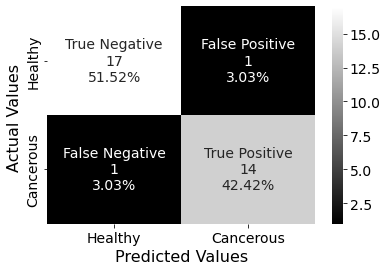

In [17]:
svm_result = classification(SVC, "svc")

CM FOR SVC

In [ ]:
# svm_result = classification(SVC, "svc")

## Logistic Regression

Accuracy: 0.8787878787878788

Recall: 0.9333333333333333

Specificity: 0.8333333333333334

Precision: 0.8235294117647058

False postive rate: 0.16666666666666666

F1-score: 0.8749999999999999

RMSE: 0.3481553119113957

Classification Report:

               precision    recall  f1-score   support

           0       0.94      0.83      0.88        18
           1       0.82      0.93      0.87        15

    accuracy                           0.88        33
   macro avg       0.88      0.88      0.88        33
weighted avg       0.89      0.88      0.88        33



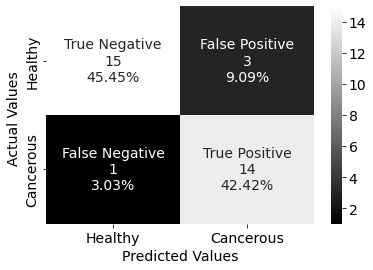

In [11]:
lr_result = classification(LogisticRegression, "lr")

## Random Forest

Accuracy: 0.8181818181818182

Recall: 0.8666666666666667

Specificity: 0.7777777777777778

Precision: 0.7647058823529411

False postive rate: 0.2222222222222222

F1-score: 0.8125

RMSE: 0.4264014327112209

Classification Report:

               precision    recall  f1-score   support

           0       0.88      0.78      0.82        18
           1       0.76      0.87      0.81        15

    accuracy                           0.82        33
   macro avg       0.82      0.82      0.82        33
weighted avg       0.82      0.82      0.82        33



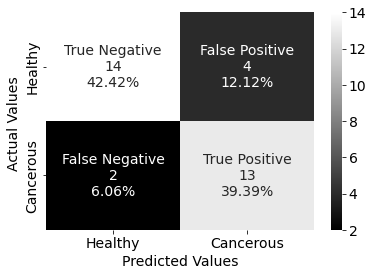

In [12]:
rf_result = classification(RandomForestClassifier, "rf")

## KNN

Accuracy: 0.8181818181818182

Recall: 0.8666666666666667

Specificity: 0.7777777777777778

Precision: 0.7647058823529411

False postive rate: 0.2222222222222222

F1-score: 0.8125

RMSE: 0.4264014327112209

Classification Report:

               precision    recall  f1-score   support

           0       0.88      0.78      0.82        18
           1       0.76      0.87      0.81        15

    accuracy                           0.82        33
   macro avg       0.82      0.82      0.82        33
weighted avg       0.82      0.82      0.82        33



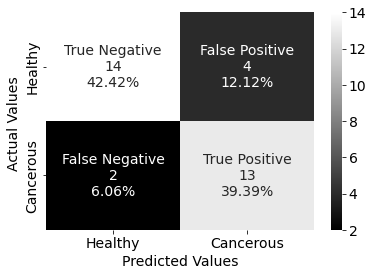

In [13]:
knn_result = classification(KNeighborsClassifier, "knn")

## Decision Tree

Accuracy: 0.8484848484848485

Recall: 1.0

Specificity: 0.7222222222222222

Precision: 0.75

False postive rate: 0.2777777777777778

F1-score: 0.8571428571428571

RMSE: 0.3892494720807615

Classification Report:

               precision    recall  f1-score   support

           0       1.00      0.72      0.84        18
           1       0.75      1.00      0.86        15

    accuracy                           0.85        33
   macro avg       0.88      0.86      0.85        33
weighted avg       0.89      0.85      0.85        33



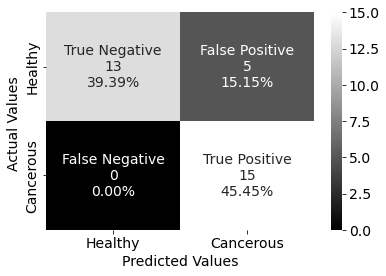

In [14]:
dt_result = classification(DecisionTreeClassifier, "dt")

#LRSG

In [ ]:
# # Evaluation of a model fit using mutual information input features
# from pandas import read_csv
# from sklearn.feature_selection import SelectKBest, mutual_info_classif
# from sklearn.model_selection import train_test_split
# from sklearn.svm import SVC


# # Load the dataset
# def load_dataset(filename):
#     data = read_csv(filename, header=None)
#     dataset = data.values
#     X = dataset[:, :]
#     return X


# # Function for feature selection 
# def select_features(X_train, y_train, X_test):
#     fs = SelectKBest(score_func=mutual_info_classif, k=5)
#     fs.fit(X_train, y_train)
#     X_train_fs = fs.transform(X_train)
#     X_test_fs = fs.transform(X_test)
#     return X_train_fs, X_test_fs


# # Load the dataset
# X = load_dataset('/content/drive/MyDrive/CIP - SEM 6/features_using_new_dataset.csv')

# for i in range(1,70):
#   # Splitting into train and test sets
#   X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=i)

#   # Feature selection
#   X_train_fs, X_test_fs = select_features(X_train, y_train, X_test)

#   # Fit the model
#   model = SVC()
#   model.fit(X_train_fs, y_train)

#   # Predict the model
#   y_pred = model.predict(X_test_fs)

#   from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, mean_squared_error, precision_score, recall_score, classification_report, f1_score, plot_confusion_matrix, roc_curve, roc_auc_score, precision_recall_curve

#   # Confusion Matrix
#   cm = confusion_matrix(y_test, y_pred, labels=model.classes_)

#   # Accuracy 
#   print("\n i =", i, "Accuracy:", accuracy_score(y_test, y_pred))

# ROC curve

In [15]:
def plot_roc(scores, name, color):
  plt.plot(scores["fpr"], scores["tpr"], label= name +" = " + str(round(scores["auc"], 3)), linestyle='--', color=color)

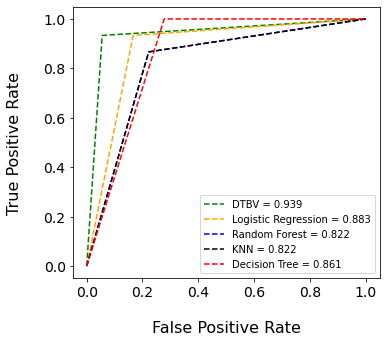

In [18]:
plt.rc('font', size=14)         # controls default text sizes
plt.rc('axes', titlesize=16)    # fontsize of the axes title
plt.rc('axes', labelsize=16)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=14)   # fontsize of the tick labels
plt.rc('ytick', labelsize=14)   # fontsize of the tick labels
plt.rc('legend', fontsize=10)   # legend fontsize
plt.rc('figure', titlesize=14)  # fontsize of the figure title
plt.figure(figsize = (5.5, 5)) 
# create ROC curve
plot_roc(svm_result, "DTBV", "green")
plot_roc(lr_result, "Logistic Regression", "orange")
plot_roc(rf_result, "Random Forest", "blue")
plot_roc(knn_result, "KNN", "black")
plot_roc(dt_result, "Decision Tree", "red")

# plt.title('ROC curve\n')
plt.ylabel('True Positive Rate\n')
plt.xlabel('\nFalse Positive Rate')
plt.legend(loc=4)
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/ROC2.pdf', bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/ROC2.png', dpi = 1000, bbox_inches='tight')
plt.show()

# Comparison of different model

## Accuracy

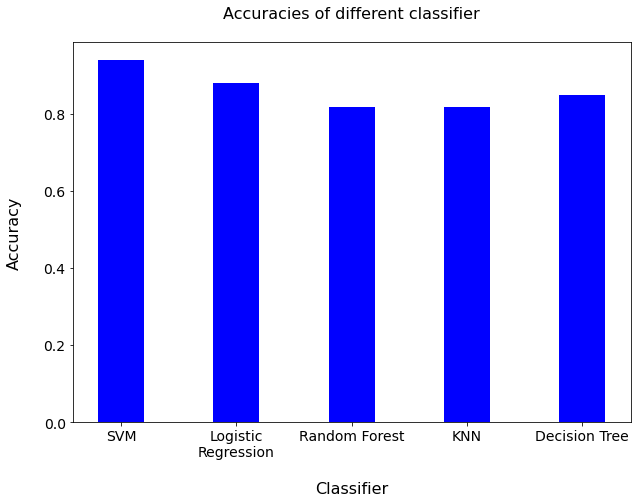

In [19]:
# Plot a graphic which we can see test accuracies of Transfer Learning models
data = {'SVM': svm_result["Accuracy"],
        'Logistic\nRegression': lr_result["Accuracy"],
        'Random Forest': rf_result["Accuracy"],  
        'KNN': knn_result["Accuracy"],
        'Decision Tree': dt_result["Accuracy"]} 

models = list(data.keys()) 
accuracies = list(data.values()) 
   
plt.figure(figsize = (10, 7)) 
  
plt.bar(models, accuracies, color='blue', width=0.4) 

plt.xlabel("\nClassifier") 
plt.ylabel("Accuracy\n") 
plt.title("Accuracies of different classifier\n") 
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/accuracy_comparison2.pdf', bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/accuracy_comparison2.png', dpi = 1000, bbox_inches='tight')
plt.show() 

## Precision

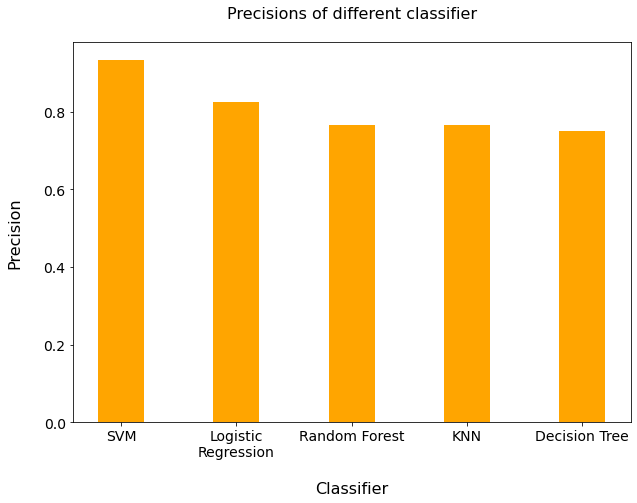

In [20]:
# Plot a graphic which we can see test accuracies of Transfer Learning models
data = {'SVM': svm_result["Precision"],
        'Logistic\nRegression': lr_result["Precision"],
        'Random Forest': rf_result["Precision"],  
        'KNN': knn_result["Precision"],
        'Decision Tree': dt_result["Precision"]} 

models = list(data.keys()) 
precision = list(data.values()) 
   
plt.figure(figsize = (10, 7)) 
  
plt.bar(models, precision, color='orange', width=0.4) 

plt.xlabel("\nClassifier") 
plt.ylabel("Precision\n") 
plt.title("Precisions of different classifier\n")
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/precision_comparison2.pdf', bbox_inches='tight') 
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/precision_comparison2.png', dpi = 1000, bbox_inches='tight') 
plt.show() 

## Recall value

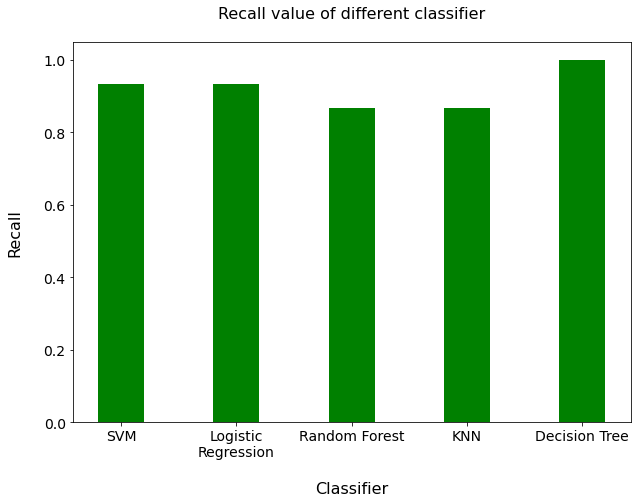

In [21]:
# Plot a graphic which we can see test accuracies of Transfer Learning models
data = {'SVM': svm_result["Recall"],
        'Logistic\nRegression': lr_result["Recall"],
        'Random Forest': rf_result["Recall"],  
        'KNN': knn_result["Recall"],
        'Decision Tree': dt_result["Recall"]} 

models = list(data.keys()) 
recall = list(data.values()) 
   
plt.figure(figsize = (10, 7)) 
  
plt.bar(models, recall, color='green', width=0.4) 

plt.xlabel("\nClassifier") 
plt.ylabel("Recall\n") 
plt.title("Recall value of different classifier\n") 
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/recall_comparison2.pdf')
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/recall_comparison2.png', dpi = 1000, bbox_inches='tight')
plt.show() 

## F1-score

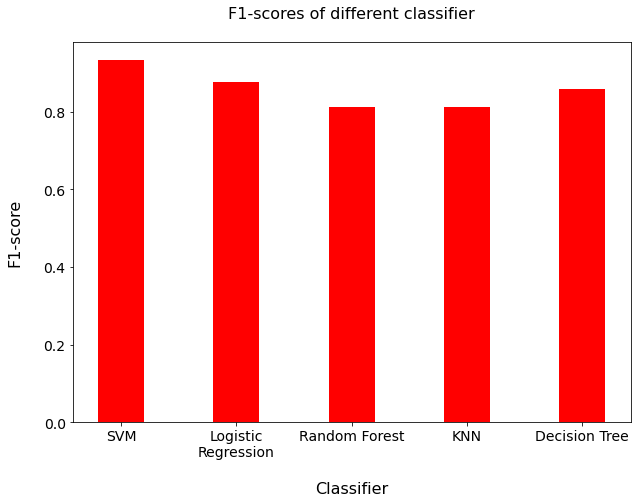

In [22]:
# Plot a graphic which we can see test accuracies of Transfer Learning models
data = {'SVM': svm_result["F1-score"],
        'Logistic\nRegression': lr_result["F1-score"],
        'Random Forest': rf_result["F1-score"],  
        'KNN': knn_result["F1-score"],
        'Decision Tree': dt_result["F1-score"]} 

models = list(data.keys()) 
f1score = list(data.values()) 
   
plt.figure(figsize = (10, 7)) 
  
plt.bar(models, f1score, color='red', width=0.4) 

plt.xlabel("\nClassifier") 
plt.ylabel("F1-score\n") 
plt.title("F1-scores of different classifier\n") 
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/f1score_comparison2.pdf', bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/f1score_comparison2.png', dpi=1000, bbox_inches='tight')
plt.show() 

### Precision-Recall curve

In [23]:
def plot_prc(scores, name, color):
    plt.plot(scores["pr"], scores["re"], label= name, linestyle='--', color=color)

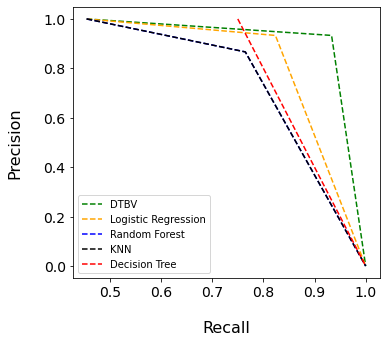

In [24]:
plt.rc('font', size=14)         # controls default text sizes
plt.rc('axes', titlesize=16)    # fontsize of the axes title
plt.rc('axes', labelsize=16)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=14)   # fontsize of the tick labels
plt.rc('ytick', labelsize=14)   # fontsize of the tick labels
plt.rc('legend', fontsize=10)   # legend fontsize
plt.rc('figure', titlesize=14)  # fontsize of the figure title
plt.figure(figsize = (5.5, 5)) 
plot_prc(svm_result, "DTBV", "green")
plot_prc(lr_result, "Logistic Regression", "orange")
plot_prc(rf_result, "Random Forest", "blue")
plot_prc(knn_result, "KNN", "black")
plot_prc(dt_result, "Decision Tree", "red")

# plt.title('Precision-Recall curve\n')
plt.ylabel('Precision\n')
plt.xlabel('\nRecall')
plt.legend(loc=3)
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/PRC2.pdf', bbox_inches='tight')
plt.savefig('/content/drive/MyDrive/CIP - SEM 6/PRC2.png', dpi=1000, bbox_inches='tight')
plt.show()